# Import Necessary Libraries

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!pip install -q albumentations==0.5.2
import albumentations as A

In [ ]:
import torch
torch.__version__

'2.0.0+cu118'

In [ ]:
torch.cuda.get_device_name(0)

'Tesla T4'

In [ ]:
import torchvision
torchvision.__version__

'0.15.1+cu118'

In [ ]:
!pip install -q pytorch_lightning
import pytorch_lightning as pl
print(pl.__version__)

2.0.2


# Creating Dataset

In [ ]:
from xml.etree.ElementTree import parse
from albumentations.pytorch import ToTensor
from torchvision import transforms
import os
import numpy as np
from PIL import Image

In [ ]:
class Mask_Dataset(torch.utils.data.Dataset):

    def __init__(self, var_root):

        self.root = var_root
        
        self.mask_category = ['BG', 'without_mask', 'with_mask', 'mask_weared_incorrect']
        self.images = list(sorted(os.listdir('/content/drive/MyDrive/SSD/images/')))

        bounding_box_params = A.BboxParams(format = 'pascal_voc', label_fields = ['class_labels'])
        
        self.transform = A.Compose([
            A.HorizontalFlip(p = 0.1),
            A.VerticalFlip(p = 0.1),
            A.RandomBrightnessContrast(p = 0.1),
            ToTensor()
          ], bbox_params = bounding_box_params)

    def __getitem__(self, idx):

        data = 'maksssksksss' + str(idx)

        image_path = f'{self.root}/images/{data}.png'

        image = Image.open(image_path).convert('RGB')

        image = np.array(image)

        annoted_path = f'{self.root}/annotations/{data}.xml'

        parser_list = parse(annoted_path)

        all_labels, all_boxes = [], []

        for objt in parser_list.findall('object'):

            boundbox = objt.find('bndbox')

            if boundbox.find('xmin').text != boundbox.find('xmax').text:

                each_box = [int(tag.text) for tag in objt.find('bndbox')]
                label_var = objt.find('name').text
                label_var = self.mask_category.index(label_var)
                all_boxes.append(each_box)
                all_labels.append(label_var)
                
        transformed_data = self.transform(image = image, bboxes = all_boxes, class_labels = all_labels)
        image = transformed_data['image']
        all_boxes = torch.tensor(transformed_data['bboxes'], dtype = torch.float32)
        all_labels = torch.tensor(transformed_data['class_labels'], dtype = torch.int64)
        area = (all_boxes[:, 2] - all_boxes[:, 0]) * (all_boxes[:, 3] - all_boxes[:, 1])
        image_id = torch.tensor([idx])
        iscrowd = torch.zeros((len(parser_list.findall('object')),), dtype = torch.int64)

        target = {'boxes': all_boxes, 'labels': all_labels, 'image_id': image_id, 'area': area, 'iscrowd': iscrowd}

        return image, target


    def __len__(self):
        return len(self.images)

In [ ]:
pl.seed_everything(0)
root_dir = '/content/drive/MyDrive/SSD/'
dataset_1 = Mask_Dataset(root_dir)

INFO:lightning_fabric.utilities.seed:Global seed set to 0


In [ ]:
len(dataset_1)

853

In [ ]:
x, t = dataset_1[0]

In [ ]:
x

tensor([[[0.4431, 0.4314, 0.3843,  ..., 0.1569, 0.2824, 0.3373],
         [0.4118, 0.3882, 0.3451,  ..., 0.1529, 0.1882, 0.3098],
         [0.3765, 0.3569, 0.3255,  ..., 0.1490, 0.1216, 0.2784],
         ...,
         [0.3333, 0.3412, 0.3569,  ..., 0.1098, 0.1098, 0.1137],
         [0.3373, 0.3490, 0.3608,  ..., 0.1137, 0.1137, 0.1176],
         [0.3647, 0.3765, 0.3922,  ..., 0.1176, 0.1176, 0.1216]],

        [[0.4353, 0.4235, 0.3765,  ..., 0.2314, 0.3843, 0.4549],
         [0.3922, 0.3804, 0.3373,  ..., 0.2275, 0.2863, 0.4275],
         [0.3608, 0.3412, 0.3098,  ..., 0.2235, 0.2235, 0.3922],
         ...,
         [0.3255, 0.3333, 0.3490,  ..., 0.1059, 0.1059, 0.1098],
         [0.3294, 0.3412, 0.3529,  ..., 0.1098, 0.1098, 0.1137],
         [0.3569, 0.3686, 0.3843,  ..., 0.1137, 0.1137, 0.1176]],

        [[0.4549, 0.4431, 0.3961,  ..., 0.4000, 0.6157, 0.7294],
         [0.4157, 0.3922, 0.3490,  ..., 0.3843, 0.5059, 0.6784],
         [0.3647, 0.3451, 0.3137,  ..., 0.3529, 0.4118, 0.

In [ ]:
type(x), x.dtype, x.shape

(torch.Tensor, torch.float32, torch.Size([3, 366, 512]))

In [ ]:
t

{'boxes': tensor([[ 79., 105., 109., 142.],
         [185., 100., 226., 144.],
         [325.,  90., 360., 141.]]),
 'labels': tensor([1, 2, 1]),
 'image_id': tensor([0]),
 'area': tensor([1110., 1804., 1785.]),
 'iscrowd': tensor([0, 0, 0])}

## Removing incorrect data from the augmentation step

In [ ]:
x.shape[2]

512

In [ ]:
t['boxes'][0][2].item()

109.0

In [ ]:
len(t['boxes'])

3

In [ ]:
for i in range(len(t['boxes'])):

    if x.shape[2] < t['boxes'][i][2]:
        print("Shape of x is:",x.shape)
        print("t is",t)
    else:
        print('Not a problem.')

Not a problem.
Not a problem.
Not a problem.


In [ ]:
for i in range(len(dataset_1)):

    try:
        x, t = dataset_1[i]

    except Exception as e:
        print("Warning!!")
        print(f"{i},")

Warning!!
5,
Warning!!
93,
Warning!!
110,
Warning!!
231,
Warning!!
251,
Warning!!
457,
Warning!!
501,
Warning!!
603,
Warning!!
616,
Warning!!
706,
Warning!!
787,


In [ ]:
removal_list = [5,93,110,231,251,457,501,603,616,706,787]

In [ ]:
dataset_final = []
for i in range(len(dataset_1)):
  
    if i in removal_list:
        pass
    else:
        dataset_final.append(dataset_1[i])

In [ ]:
len(dataset_final)

842

In [ ]:
for i in range(len(dataset_final)):
    try:
        x, t = dataset_final[i]
        
    except Exception as e:
        print(f"Error on {i}.")

In [ ]:
dataset_1 = dataset_final

In [ ]:
for i in range(len(dataset_1)):
    try:
        x, t = dataset_1[i]
    except Exception as e:
        print(f"Error on {i}.")

# Visualizing the sample data

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import ImageDraw, ImageFont

In [ ]:
%%capture
!if [ ! -d fonts ]; then mkdir fonts && cd fonts && wget https://noto-website-2.storage.googleapis.com/pkgs/NotoSansCJKjp-hinted.zip && unzip NotoSansCJKjp-hinted.zip && cd .. ;fi

In [ ]:
def boxes_visualization(x, t):

    mask_categories = ['BG', 'without_mask', 'with_mask', 'mask_weared_incorrect']

    single_image = x.permute(1, 2, 0).numpy()

    single_image = Image.fromarray((single_image * 255).astype(np.uint8))

    boxes_cord = t['boxes'].cpu().detach().numpy()

    labels = t['labels'].cpu().detach().numpy()

    draw = ImageDraw.Draw(single_image)
    font = ImageFont.truetype('fonts/NotoSansMonoCJKjp-Bold.otf', 7)
    
    for box, label in zip(boxes_cord, labels):
        # box
        draw.rectangle(box, outline = 'red')
        # label
        text = mask_categories[label]
        w, h = font.getsize(text)
        draw.rectangle([box[0], box[1], box[0] + w, box[1] + h], fill = 'red')
        draw.text((box[0], box[1]), text, font = font, fill = 'white')

    return single_image

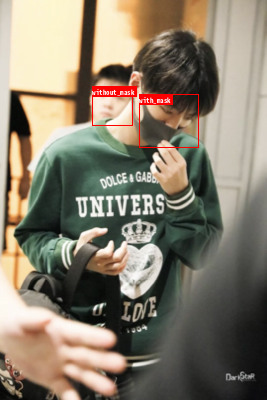

In [ ]:
boxes_visualization(x, t)

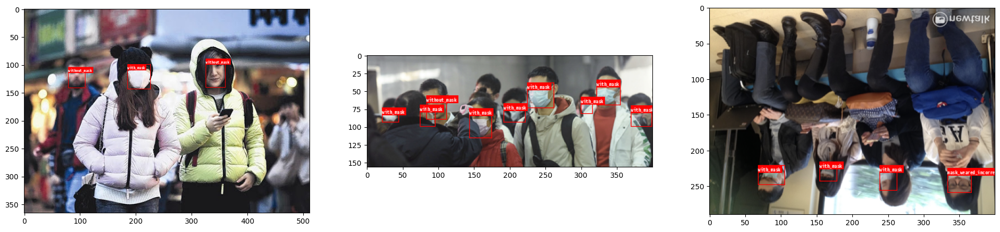

In [ ]:
plt.figure(figsize = (24, 12))

for i in range(3):
    x, t = dataset_1[i]
    image = boxes_visualization(x, t)
    
    plt.subplot(1, 3, i + 1)
    plt.imshow(image)

In [ ]:
train_1, val_1, test_1 = torch.utils.data.random_split(dataset = dataset_1, lengths = [752, 40, 50], generator = torch.Generator().manual_seed(4))

In [ ]:
len(train_1), len(val_1), len(test_1)

(752, 40, 50)

In [ ]:
def collate_func(batch):
    return list(zip(* batch))

batch_size = 8

train_loader = torch.utils.data.DataLoader(train_1, batch_size, shuffle = False, drop_last = True, collate_fn = collate_func)

In [ ]:
x, t = next(iter(train_loader))

In [ ]:
x

(tensor([[[0.3922, 0.3843, 0.3961,  ..., 0.5922, 0.5922, 0.5843],
          [0.4039, 0.3922, 0.4078,  ..., 0.5922, 0.5882, 0.5843],
          [0.4078, 0.4000, 0.4000,  ..., 0.5882, 0.5882, 0.5765],
          ...,
          [0.0549, 0.0275, 0.0275,  ..., 0.3686, 0.3608, 0.3569],
          [0.0549, 0.0235, 0.0235,  ..., 0.3725, 0.3686, 0.3490],
          [0.0863, 0.0549, 0.0588,  ..., 0.3922, 0.3725, 0.3647]],
 
         [[0.3647, 0.3608, 0.3686,  ..., 0.5961, 0.5961, 0.5882],
          [0.3765, 0.3686, 0.3804,  ..., 0.5961, 0.5922, 0.5882],
          [0.3843, 0.3725, 0.3765,  ..., 0.5922, 0.5922, 0.5804],
          ...,
          [0.0627, 0.0353, 0.0353,  ..., 0.3804, 0.3725, 0.3686],
          [0.0627, 0.0314, 0.0314,  ..., 0.3843, 0.3804, 0.3608],
          [0.0902, 0.0588, 0.0627,  ..., 0.4000, 0.3843, 0.3804]],
 
         [[0.3176, 0.3176, 0.3255,  ..., 0.6196, 0.6196, 0.6078],
          [0.3333, 0.3216, 0.3333,  ..., 0.6157, 0.6157, 0.6118],
          [0.3412, 0.3255, 0.3294,  ...,

In [ ]:
len(x)

8

In [ ]:
t

({'boxes': tensor([[156.,  54., 254., 163.],
          [ 35., 170.,  90., 223.],
          [234.,  17., 294.,  96.]]),
  'labels': tensor([2, 2, 1]),
  'image_id': tensor([349]),
  'area': tensor([10682.,  2915.,  4740.]),
  'iscrowd': tensor([0, 0, 0])},
 {'boxes': tensor([[148., 130., 176., 161.],
          [233., 126., 261., 155.],
          [ 43., 138.,  62., 160.],
          [108., 115., 131., 137.],
          [288., 116., 303., 138.],
          [318., 133., 336., 151.],
          [365., 129., 382., 148.],
          [188., 132., 199., 147.]]),
  'labels': tensor([2, 2, 1, 1, 1, 1, 1, 1]),
  'image_id': tensor([570]),
  'area': tensor([868., 812., 418., 506., 330., 324., 323., 165.]),
  'iscrowd': tensor([0, 0, 0, 0, 0, 0, 0, 0])},
 {'boxes': tensor([[ 66.,  75., 105., 115.],
          [177.,  91., 202., 116.],
          [152.,  65., 175.,  90.],
          [251.,  85., 281., 115.]]),
  'labels': tensor([2, 2, 2, 2]),
  'image_id': tensor([278]),
  'area': tensor([1560.,  625.,  575

In [ ]:
type(x)

tuple

# Dataset without data augmentation for validation and test

In [ ]:
class Mask_Dataset(torch.utils.data.Dataset):

    def __init__(self, root_var):
        self.root = root_var
        self.mask_categories = ['BG', 'without_mask', 'with_mask', 'mask_weared_incorrect']
        self.imgs = list(sorted(os.listdir('/content/drive/MyDrive/SSD/images/')))

        boundingbox_params = A.BboxParams(format = 'pascal_voc', label_fields = ['class_labels'])

        self.transform = A.Compose([ToTensor()], bbox_params = boundingbox_params)
    

    def __getitem__(self, idx):
        data = 'maksssksksss' + str(idx)

        image_path = f'{self.root}/images/{data}.png'
        each_image = Image.open(image_path).convert('RGB')
        each_image = np.array(image)

        annotation_path = f'{self.root}/annotations/{data}.xml'
        parser_list = parse(annotation_path)
        all_labels, all_boxes = [], []
        for obj in parser_list.findall('object'):
            boundbox = obj.find('bndbox')
            if boundbox.find('xmin').text != boundbox.find('xmax').text:
                each_box = [int(tag.text) for tag in obj.find('bndbox')]
                each_label = obj.find('name').text
                each_label = self.mask_categories.index(each_label)
                all_boxes.append(each_box)
                all_labels.append(each_label)
                
        transformed_data = self.transform(image = each_image, bboxes = all_boxes, class_labels = all_labels)
        each_image = transformed_data['image']
        all_boxes = torch.tensor(transformed_data['bboxes'], dtype = torch.float32)
        all_labels = torch.tensor(transformed_data['class_labels'], dtype = torch.int64)
        area = (all_boxes[:, 2] - all_boxes[:, 0]) * (all_boxes[:, 3] - all_boxes[:, 1])
        image_id = torch.tensor([idx])
        is_crowd = torch.zeros((len(parser_list.findall('object')),), dtype = torch.int64)

        target_data = {'boxes': all_boxes, 'labels': all_labels, 'image_id': image_id, 'area': area, 'iscrowd': is_crowd}

        return each_image, target_data


    def __len__(self):
        return len(self.imgs)

In [ ]:
pl.seed_everything(0)
root_dir = '/content/drive/MyDrive/SSD/'
dataset_2 = Mask_Dataset(root_dir)

INFO:lightning_fabric.utilities.seed:Global seed set to 0


In [ ]:
dataset_var = []
removed_var = []
for i in range(len(dataset_2)):

    if i in removal_list:
        removed_var.append(dataset_2[i])

    else:

        dataset_var.append(dataset_2[i])

In [ ]:
len(dataset_var)

842

In [ ]:
dataset_2 = dataset_var

In [ ]:
train_2, val_2, test_2 = torch.utils.data.random_split(dataset = dataset_2, lengths = [752, 40, 50], generator = torch.Generator().manual_seed(42))

In [ ]:
len(train_2), len(val_2), len(test_2)

(752, 40, 50)

## Using the removed data for validation/test.

In [ ]:
value = []
for i in range(len(val_2)):
    val.append(val_2[i])
for i in range(len(removed_var)):
    val.append(removed_var[i])
len(value)

0

In [ ]:
val_2 = value
len(val_2)

0

In [ ]:
def collate_func(batch):
    result = list(zip(* batch))
    return result

batch_size = 8

val_loader = torch.utils.data.DataLoader(val_2, batch_size, collate_fn = collate_func)
test_loader = torch.utils.data.DataLoader(test_2, batch_size, collate_fn = collate_func)

# Training, Validating, and Testing using Retina_Net

In [ ]:
import math
from torchvision.models.detection import retinanet_resnet50_fpn

In [ ]:
class Net(pl.LightningModule):

    def __init__(self, n_class = 4):
        super().__init__()

        self.model = retinanet_resnet50_fpn(pretrained = True)

        self.num_anchors = self.model.head.classification_head.num_anchors

        self.model.head.classification_head.num_classes = n_class

        self.cls_logits = torch.nn.Conv2d(256, self.num_anchors * n_class, kernel_size = 3, stride = 1, padding = 1)

        torch.nn.init.normal_(self.cls_logits.weight, std = 0.01)  
        torch.nn.init.constant_(self.cls_logits.bias, - math.log((1 - 0.01) / 0.01)) 
        self.model.head.classification_head.cls_logits = self.cls_logits

        for i in self.model.parameters():
            i.requires_grad = False

        for j in self.model.head.classification_head.parameters():
            j.requires_grad = True

        for k in self.model.head.regression_head.parameters():
            k.requires_grad = True

        self.model.cuda()

    def forward(self, x, t = None):
        if self.training:
            return self.model(x, t)
        else:
            return self.model(x)


    def training_step(self, batch, batch_idx):
        x, t = batch
        all_losses = self(x, t)
        final_loss = sum(all_losses.values())
        self.log('Train Loss', final_loss, on_step = True, on_epoch = True, prog_bar = True)
        return final_loss


    def validation_step(self, batch, batch_idx):
        x, t = batch
        all_losses = self.train().forward(x, t)
        final_loss = sum(all_losses.values())
        self.log('Val Loss', final_loss, on_step = False, on_epoch = True)


    def test_step(self, batch, batch_idx):
        x, t = batch
        all_losses = self.train().forward(x, t)
        final_loss = sum(all_losses.values())
        self.log('Test Loss', final_loss, on_step = False, on_epoch = True)


    def configure_optimizers(self):
        parameters = [i for i in self.model.parameters() if i.requires_grad]
        optimizer = torch.optim.Adam(parameters)
        return optimizer

In [ ]:
pl.seed_everything(0)
net = Net()
trainer = pl.Trainer(max_epochs = 30,deterministic = True)
trainer.fit(net, train_loader, val_loader)

INFO:lightning_fabric.utilities.seed:Global seed set to 0
/usr/local/lib/python3.9/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=RetinaNet_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=RetinaNet_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU availab

Sanity Checking: 0it [00:00, ?it/s]

/usr/local/lib/python3.9/dist-packages/pytorch_lightning/utilities/data.py:103: UserWarning: Total length of `DataLoader` across ranks is zero. Please make sure this was your intention.
  rank_zero_warn(


Training: 0it [00:00, ?it/s]

In [ ]:
trainer.test(dataloaders = test_loader)

/usr/local/lib/python3.9/dist-packages/pytorch_lightning/trainer/connectors/checkpoint_connector.py:148: UserWarning: `.test(ckpt_path=None)` was called without a model. The best model of the previous `fit` call will be used. You can pass `.test(ckpt_path='best')` to use the best model or `.test(ckpt_path='last')` to use the last model. If you pass a value, this warning will be silenced.
  rank_zero_warn(
INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at /content/lightning_logs/version_1/checkpoints/epoch=1-step=188.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at /content/lightning_logs/version_1/checkpoints/epoch=1-step=188.ckpt


Testing: 0it [00:00, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         Test Loss         │     3.100487232208252     │
└───────────────────────────┴───────────────────────────┘

[{'Test Loss': 3.100487232208252}]

In [ ]:
%load_ext tensorboard
%tensorboard --logdir lightning_logs/

<IPython.core.display.Javascript object>

# Visualizing Results

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import ImageDraw, ImageFont

In [ ]:
%%capture
!if [ ! -d fonts ]; then mkdir fonts && cd fonts && wget https://noto-website-2.storage.googleapis.com/pkgs/NotoSansCJKjp-hinted.zip && unzip NotoSansCJKjp-hinted.zip && cd .. ;fi

In [ ]:
def visualizing_results(input, output):

    mask_categories = ['BG', 'without_mask', 'with_mask', 'mask_weared_incorrect']

    each_image = input.permute(1, 2, 0).numpy()
    each_image = Image.fromarray((each_image * 255).astype(np.uint8))

    all_boxes = output['boxes'].cpu().detach().numpy()
    all_labels = output['labels'].cpu().detach().numpy()

    if 'scores' in output.keys():
        all_scores = output['scores'].cpu().detach().numpy()
        all_boxes = all_boxes[all_scores > 0.5]
        all_labels = all_labels[all_scores > 0.5]

    draw = ImageDraw.Draw(image)
    font = ImageFont.truetype('fonts/NotoSansCJKjp-Thin.otf', 6)
    for box, label in zip(all_boxes, all_labels):

        draw.rectangle(box, outline = 'red')

        text = mask_categories[label]
        w, h = font.getsize(text)
        draw.rectangle([box[0], box[1], box[0] + w, box[1] + h], fill = 'red')
        draw.text((box[0], box[1]), text, font = font, fill = 'white')

    return image

In [ ]:
net.cpu().eval()
x, t = test_2[0]
y = net(x.unsqueeze(0))[0]

In [ ]:
x

tensor([[[0.9647, 0.9569, 0.9765,  ..., 0.3529, 0.3529, 0.3451],
         [0.9725, 0.9686, 0.9725,  ..., 0.3529, 0.3569, 0.3451],
         [0.9686, 0.9686, 0.9686,  ..., 0.3569, 0.3529, 0.3529],
         ...,
         [0.2980, 0.2902, 0.2941,  ..., 0.6824, 0.6667, 0.6902],
         [0.2941, 0.2941, 0.3020,  ..., 0.6824, 0.6667, 0.6863],
         [0.2941, 0.2941, 0.3020,  ..., 0.6824, 0.6667, 0.6863]],

        [[0.8784, 0.8706, 0.8902,  ..., 0.3294, 0.3255, 0.3137],
         [0.8863, 0.8824, 0.8863,  ..., 0.3294, 0.3255, 0.3137],
         [0.8824, 0.8824, 0.8824,  ..., 0.3294, 0.3176, 0.3137],
         ...,
         [0.3333, 0.3294, 0.3333,  ..., 0.6471, 0.6392, 0.6627],
         [0.3333, 0.3333, 0.3373,  ..., 0.6471, 0.6392, 0.6627],
         [0.3333, 0.3333, 0.3373,  ..., 0.6471, 0.6392, 0.6627]],

        [[0.6784, 0.6706, 0.6863,  ..., 0.2706, 0.2706, 0.2627],
         [0.6824, 0.6824, 0.6863,  ..., 0.2706, 0.2706, 0.2588],
         [0.6784, 0.6784, 0.6784,  ..., 0.2706, 0.2549, 0.

In [ ]:
t

{'boxes': tensor([[124.,  48., 143.,  96.],
         [201.,  89., 235., 121.],
         [226.,  15., 271.,  66.]]),
 'labels': tensor([1, 1, 2]),
 'image_id': tensor([189]),
 'area': tensor([ 912., 1088., 2295.]),
 'iscrowd': tensor([0, 0, 0])}

In [ ]:
y

{'boxes': tensor([[6.7721e+01, 2.1524e+02, 1.0738e+02, 2.5549e+02],
         [1.5152e+02, 2.0798e+02, 1.8866e+02, 2.4574e+02],
         [3.1309e+02, 5.3781e+00, 3.3340e+02, 2.7200e+01],
         [3.3364e+02, 2.3499e+02, 3.6795e+02, 2.6686e+02],
         [2.3147e+02, 2.0624e+02, 2.8526e+02, 2.7318e+02],
         [2.1894e+02, 1.1247e+01, 2.3810e+02, 3.2303e+01],
         [2.1172e+02, 1.7215e+02, 2.2778e+02, 1.9138e+02],
         [2.1796e+02, 3.0437e+01, 2.3649e+02, 5.6575e+01],
         [3.3136e+02, 2.1380e+02, 3.6984e+02, 2.5397e+02],
         [2.3707e+02, 2.1939e+02, 2.6990e+02, 2.5799e+02],
         [3.3199e+02, 2.4638e+02, 3.6921e+02, 2.8267e+02],
         [2.1122e+02, 1.7268e+02, 2.2624e+02, 1.9117e+02],
         [6.6147e+01, 2.3154e+02, 1.0536e+02, 2.6882e+02],
         [2.1414e+02, 1.7401e+02, 2.3353e+02, 1.9522e+02],
         [9.5213e+01, 9.9652e+01, 1.2461e+02, 1.3078e+02],
         [2.9654e+02, 1.1635e+02, 3.7385e+02, 1.9515e+02],
         [2.4079e+02, 4.2767e+00, 2.6052e+02, 2

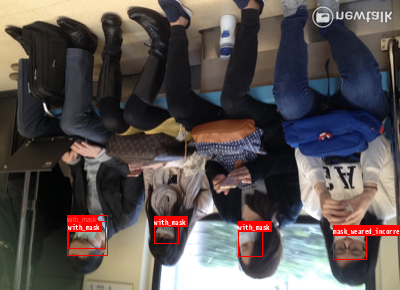

In [ ]:
visualizing_results(x, y)

In [ ]:
x, t = test_2[1]
y = net(x.unsqueeze(0))[0]

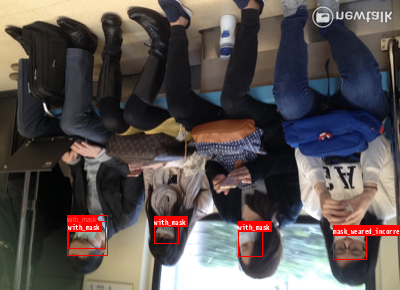

In [ ]:
visualizing_results(x, y)

# Non Maximum Suppression [NMS] for selecting Best Boxes

In [ ]:
from torchvision.ops import batched_nms

In [ ]:
keep = batched_nms(boxes = y['boxes'], scores = y['scores'], idxs = y['labels'], iou_threshold = 0.205)
keep

tensor([  0,   1,   2,   3,   4,   5,   6,   7,  11,  14,  15,  16,  18,  19,
         21,  23,  24,  25,  26,  29,  34,  35,  37,  42,  44,  49,  50,  52,
         53,  54,  62,  65,  66,  67,  75,  77,  79,  81,  83,  87,  91,  92,
         93,  96, 100, 101, 106, 107, 108, 113, 116, 123, 136, 139, 143, 145,
        149, 156])

In [ ]:
y['boxes'][keep]

tensor([[ 67.7207, 215.2383, 107.3766, 255.4926],
        [151.5238, 207.9791, 188.6627, 245.7397],
        [313.0851,   5.3781, 333.3970,  27.1999],
        [333.6405, 234.9884, 367.9548, 266.8634],
        [231.4750, 206.2375, 285.2642, 273.1813],
        [218.9392,  11.2466, 238.1031,  32.3026],
        [211.7190, 172.1514, 227.7757, 191.3774],
        [217.9618,  30.4367, 236.4934,  56.5750],
        [211.2155, 172.6780, 226.2386, 191.1741],
        [ 95.2126,  99.6523, 124.6135, 130.7769],
        [296.5386, 116.3451, 373.8533, 195.1539],
        [240.7916,   4.2767, 260.5214,  28.4929],
        [284.6234,   6.4069, 307.1170,  29.2050],
        [195.2983,  18.7457, 230.4160,  60.8360],
        [ 71.0758, 128.6092, 108.7451, 165.4205],
        [222.9409,  20.4005, 262.1172,  79.0995],
        [174.4985,   9.7624, 191.8965,  29.7958],
        [170.5332,  22.7065, 190.3226,  45.1980],
        [211.1661, 172.6987, 225.7766, 191.9658],
        [103.0874,  25.7943, 122.4749,  53.4756],


In [ ]:
y['scores'][keep]

tensor([0.5003, 0.4964, 0.4466, 0.4389, 0.4000, 0.3742, 0.3077, 0.2973, 0.2764,
        0.2147, 0.1977, 0.1945, 0.1719, 0.1612, 0.1584, 0.1573, 0.1572, 0.1572,
        0.1555, 0.1466, 0.1348, 0.1337, 0.1313, 0.1246, 0.1218, 0.1162, 0.1148,
        0.1129, 0.1109, 0.1087, 0.0986, 0.0977, 0.0964, 0.0957, 0.0895, 0.0878,
        0.0865, 0.0861, 0.0857, 0.0829, 0.0821, 0.0809, 0.0799, 0.0794, 0.0786,
        0.0785, 0.0761, 0.0760, 0.0757, 0.0739, 0.0731, 0.0707, 0.0663, 0.0646,
        0.0622, 0.0612, 0.0590, 0.0556], grad_fn=<IndexBackward0>)

In [ ]:
y['labels'][keep]

tensor([2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 1, 2, 2, 3, 2, 2, 2, 2, 2,
        3, 1, 1, 2, 1, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 3, 1, 2, 2, 2, 2, 1, 2, 2,
        3, 1, 2, 3, 1, 2, 3, 1, 2, 1])

In [ ]:
y_nmaxs = {'boxes': y['boxes'][keep], 'labels': y['labels'][keep], 'scores': y['scores'][keep]}
y_nmaxs

{'boxes': tensor([[ 67.7207, 215.2383, 107.3766, 255.4926],
         [151.5238, 207.9791, 188.6627, 245.7397],
         [313.0851,   5.3781, 333.3970,  27.1999],
         [333.6405, 234.9884, 367.9548, 266.8634],
         [231.4750, 206.2375, 285.2642, 273.1813],
         [218.9392,  11.2466, 238.1031,  32.3026],
         [211.7190, 172.1514, 227.7757, 191.3774],
         [217.9618,  30.4367, 236.4934,  56.5750],
         [211.2155, 172.6780, 226.2386, 191.1741],
         [ 95.2126,  99.6523, 124.6135, 130.7769],
         [296.5386, 116.3451, 373.8533, 195.1539],
         [240.7916,   4.2767, 260.5214,  28.4929],
         [284.6234,   6.4069, 307.1170,  29.2050],
         [195.2983,  18.7457, 230.4160,  60.8360],
         [ 71.0758, 128.6092, 108.7451, 165.4205],
         [222.9409,  20.4005, 262.1172,  79.0995],
         [174.4985,   9.7624, 191.8965,  29.7958],
         [170.5332,  22.7065, 190.3226,  45.1980],
         [211.1661, 172.6987, 225.7766, 191.9658],
         [103.0874,  2

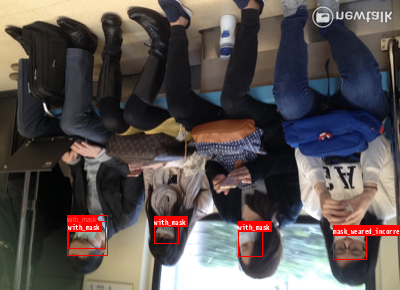

In [ ]:
visualizing_results(x, y_nmaxs)

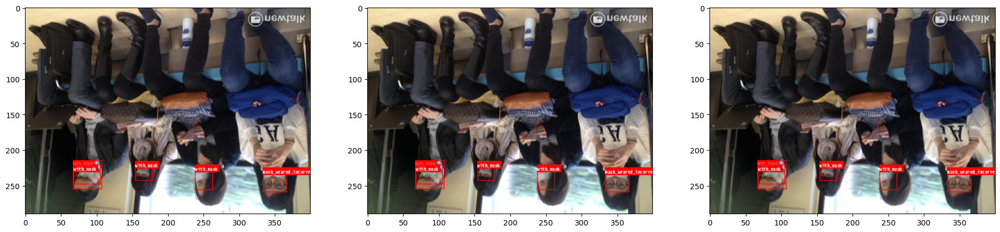

In [ ]:
plt.figure(figsize = (23, 13))
net.eval()
for i in range(3):
    x, t = test_2[i]
    y = net(x.unsqueeze(0))[0]
    keep_data = batched_nms(boxes = y['boxes'], scores = y['scores'], idxs = y['labels'], iou_threshold = 0.2)
    y_nmaxs = {'boxes': y['boxes'][keep], 'labels': y['labels'][keep], 'scores': y['scores'][keep]}
    each_image = visualizing_results(x, y_nmaxs)
    plt.subplot(1, 3, i + 1)
    plt.imshow(each_image)

# Calculate Mean Average Precision (mAP)

In [ ]:
%%capture
!if [ ! -d vision ]; then git clone https://github.com/pytorch/vision.git && cd vision && cp references/detection/utils.py ../ && cp references/detection/transforms.py ../ && cp references/detection/coco_eval.py ../ && cp references/detection/engine.py ../ && cp references/detection/coco_utils.py ../; fi

In [ ]:
!ls

coco_eval.py   drive	  fonts		  sample_data	 utils.py
coco_utils.py  engine.py  lightning_logs  transforms.py  vision


In [ ]:
pip install 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-build-do632vje
  Running command git clone --filter=blob:none --quiet https://github.com/cocodataset/cocoapi.git /tmp/pip-req-build-do632vje
  Resolved https://github.com/cocodataset/cocoapi.git to commit 8c9bcc3cf640524c4c20a9c40e89cb6a2f2fa0e9
  Preparing metadata (setup.py) ... done
  Created wheel for pycocotools: filename=pycocotools-2.0-cp39-cp39-linux_x86_64.whl size=398003 sha256=1056013745daad78290821af08da23398462184893cce2d9645f254d141c9275
  Stored in directory: /tmp/pip-ephem-wheel-cache-vhmetzg8/wheels/13/c1/d6/a321055f7089f1a6af654fbf794536b196999f082a9cb68a37
Successfully built pycocotools
  Attempting uninstall: pycocotools
    Found existing installation: pycocotools 2.0.6
    Uninstalling pycocotools-2.0.6:
      Successfully uninstalled pycocotools-2.0.6


In [ ]:
from engine import evaluate

In [ ]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda', index=0)

In [ ]:
pl.seed_everything(0)
net.to(device)
evaluate(net, test_loader, device)

INFO:lightning_fabric.utilities.seed:Global seed set to 0


creating index...
index created!
Test:  [0/7]  eta: 0:00:11  model_time: 1.1283 (1.1283)  evaluator_time: 0.5067 (0.5067)  time: 1.6394  data: 0.0006  max mem: 4806
Test:  [6/7]  eta: 0:00:01  model_time: 0.9009 (0.8342)  evaluator_time: 0.1215 (0.2069)  time: 1.0464  data: 0.0002  max mem: 4806
Test: Total time: 0:00:07 (1.0477 s / it)
Averaged stats: model_time: 0.9009 (0.8342)  evaluator_time: 0.1215 (0.2069)
Accumulating evaluation results...
DONE (t=0.08s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50

# Save the Model

In [ ]:
torch.save(net.model, 'facemask_pred_model.pth')

In [ ]:
saved_model = torch.load('/content/facemask_pred_model.pth')

In [ ]:
saved_model

RetinaNet(
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(inplace=True)
          (downsample): Sequential(
            (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (1): FrozenBatchNorm2d(256, eps=0.0)
